# Data Visualization of Lunch Form
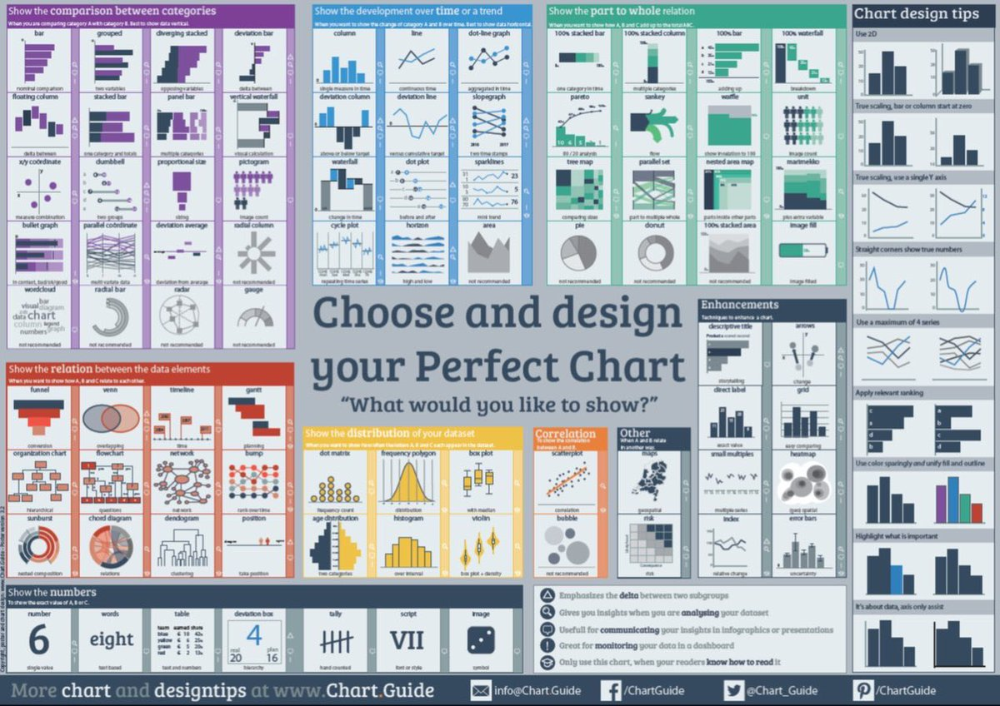

<b>Goal of the notebook:</b> I will be using the tool Bokeh to visualize data I have collected. This data is a csv file created from the generated questions and used on different questions answering models based on a Lunch form. I will be trying out different plots to see which ones are better suited based on the audience I am showing the data/results to.

<b>Side Note:</b> Later in the notebook I change from using the Bokeh tool to using the Plotly visualization tool. The reason for switching over to plotly is for easy to use visualization tool which is also new for me.

# Background Information of the Data

## General flow Concept to how the data is created

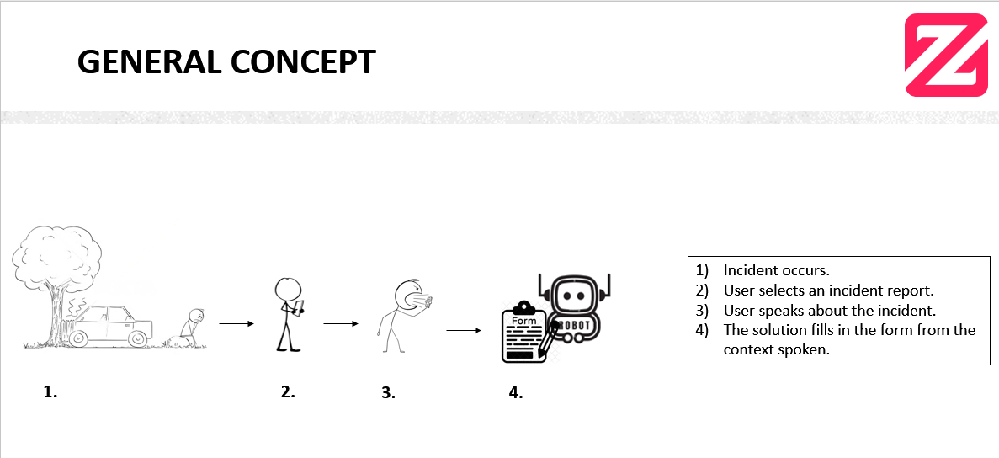

## General Concept to how the data is created Question-Answer models work

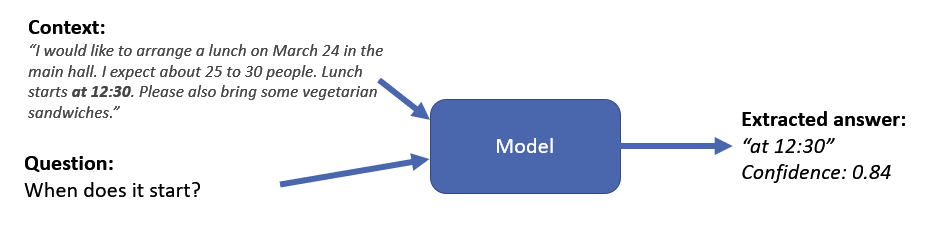

# Context used for the data

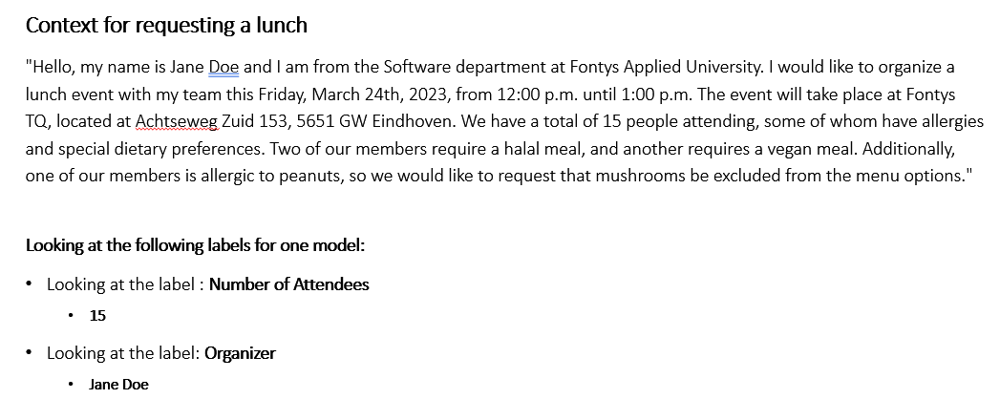

# 1. Importing Libraries

In [2]:
import pandas as pd
import os  
import numpy as np

# Circle
from math import pi

from bokeh.palettes import Category20c
from bokeh.transform import cumsum
from bokeh.plotting import figure, output_notebook, show

from squarify import normalize_sizes, squarify

from bokeh.transform import factor_cmap

import plotly.express as px
import plotly
from dash import Dash, dcc, html, Input, Output

# 2. Importing data Merged Data frame
The data that will be used are csv files created from the generated questions and used on different questions answering models. The data is a combination of answers different models predicted for each label of a form.

In [219]:
# df_nol = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\nol.csv', index_col=[0])
# df_org = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\org.csv', index_col=[0])
# df_budget = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\budget.csv', index_col=[0])
# df_date = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\date.csv', index_col=[0])
# df_s_time = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\s_time.csv', index_col=[0])
# df_e_time = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\e_time.csv', index_col=[0])
# df_location = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\location.csv', index_col=[0])
# df_food_allergies = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\food_allergies.csv', index_col=[0])
# df_food_diets = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\food_diets.csv', index_col=[0])
# df_contact_details = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\contact_details.csv', index_col=[0])

# data_frames = [df_nol, df_org, df_budget, df_date, df_s_time, df_e_time, df_location, df_food_allergies, df_food_diets, df_contact_details]
# merged_df = pd.concat(data_frames)

# merged_df.loc[merged_df['label'] == 'Number of Attendees', 'actual_answer'] = '15'
# merged_df.loc[merged_df['label'] == 'Budget', 'actual_answer'] = 'none'
# merged_df.loc[merged_df['label'] == 'Organizer', 'actual_answer'] = 'Jane Doe'
# merged_df.loc[merged_df['label'] == 'Contact Details', 'actual_answer'] = 'Jane Doe'
# merged_df.loc[merged_df['label'] == 'Date', 'actual_answer'] = 'March 24th, 2023'
# merged_df.loc[merged_df['label'] == 'End Time', 'actual_answer'] = '1:00 p.m'
# merged_df.loc[merged_df['label'] == 'Start Time', 'actual_answer'] = '12:00 p.m'
# merged_df.loc[merged_df['label'] == 'Food Allergies', 'actual_answer'] = 'peanuts'
# merged_df.loc[merged_df['label'] == 'Food Diets', 'actual_answer'] = 'halal meal, and another requires a vegan meal'
# merged_df.loc[merged_df['label'] == 'Location', 'actual_answer'] = 'Achtseweg Zuid 153, 5651 GW Eindhoven'

# merged_df.loc[merged_df['model'] == 'model 1', 'model'] = 'roberta-base-model'
# merged_df.loc[merged_df['model'] == 'model 2', 'model'] = 'distilbert-uncased-model'
# merged_df.loc[merged_df['model'] == 'model 3', 'model'] = 'distilbert-cased-model'
# merged_df.loc[merged_df['model'] == 'model 4', 'model'] = 'bert-large'
# merged_df.loc[merged_df['model'] == 'model 5', 'model'] = 'deberta'
# merged_df.loc[merged_df['model'] == 'model 6', 'model'] = 'bert-medium'

# merged_df['occurence'] = 1
# merged_df['correctly_predicted'] = merged_df.apply(lambda row: all(i in row.actual_answer for i in row.answer), axis=1)
# # merged_df['correctly_predicted'] = merged_df['answer'].eq(merged_df['actual_answer'])
# # merged_df['correctly_predicted'] = merged_df['answer'].equals(merged_df['actual_answer'])
# # merged_df['correctly_predicted'] = merged_df['answer'].str.strip().str.lower()==merged_df['actual_answer'].str.strip().str.lower()

# merged_df.to_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\merged.csv')
# merged_df

In [3]:
df = pd.read_csv(r'C:\Users\victo\source\repos\Semester 7\JupyterLab\Group\Question Generator\csv_ouput\merged.csv', index_col=[0])
df

,label,questions,answer,score,model,percentage,actual_answer,occurence,correctly_predicted,interrogative_pronouns,model_num
0,Number of Attendees,what Number of Attendees?,15,62.77,roberta-base-model,10.392900,15,1,True,what,1.0
1,Number of Attendees,who Number of Attendees?,15,67.06,roberta-base-model,11.103200,15,1,True,who,1.0
2,Number of Attendees,where Number of Attendees?,15,46.99,roberta-base-model,7.780188,15,1,True,where,1.0
3,Number of Attendees,when Number of Attendees?,15,55.51,roberta-base-model,9.190854,15,1,True,when,1.0
4,Number of Attendees,why Number of Attendees?,15,55.14,roberta-base-model,9.129593,15,1,True,why,1.0
...,...,...,...,...,...,...,...,...,...,...,...
5,Contact Details,how many Contact Details?,15,0.27,bert-medium,1.383906,Jane Doe,1,False,how many,6.0
6,Contact Details,how much Contact Details?,15,0.09,bert-medium,0.461302,Jane Doe,1,False,how much,6.0
7,Contact Details,how Contact Details?,Software department at Fontys Applied University,0.00,bert-medium,0.000000,Jane Doe,1,False,how,6.0
8,Contact Details,whose Contact Details?,Jane Doe,1.84,bert-medium,9.431061,Jane Doe,1,True,whose,6.0


# 3. Exloratory Data Analysis using Bokeh
In this chapter I will be exploring the data using Bokeh. 

## 3.1. PieCharts
I will be visually representing the different labels that are used in the dataset

In [5]:
x = df.label.value_counts()
data = pd.Series(x).reset_index(name='value').rename(columns={'index': 'country'})
data['angle'] = data['value']/data['value'].sum() * 2*pi
data['color'] = Category20c[len(x)]
data

,label,value,angle,color
0,Number of Attendees,60,0.628319,#3182bd
1,Organizer,60,0.628319,#6baed6
2,Budget,60,0.628319,#9ecae1
3,Date,60,0.628319,#c6dbef
4,Start Time,60,0.628319,#e6550d
5,End Time,60,0.628319,#fd8d3c
6,Location,60,0.628319,#fdae6b
7,Food Allergies,60,0.628319,#fdd0a2
8,Food Diets,60,0.628319,#31a354
9,Contact Details,60,0.628319,#74c476


In [6]:
p = figure(height=350, title="Pie Chart", toolbar_location=None,
           tools="hover", tooltips="@country: @value", x_range=(-0.5, 1.0))

p.wedge(x=0, y=1, radius=0.4,
        start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
        line_color="white", fill_color='color', legend_field='country', source=data)

p.axis.axis_label = None
p.axis.visible = False
p.grid.grid_line_color = None
output_notebook()
show(p)

Loading BokehJS ...

ERROR:bokeh.core.validation.check:E-1001 (BAD_COLUMN_NAME): Glyph refers to nonexistent column name. This could either be due to a misspelling or typo, or due to an expected column being missing. : LegendItem(id='p1051', ...)


So a little background of the data. The data is based questions created for a lunch form. The lunch form has different kinds of labels which we will touch down in a bit but as we can see from the above piechart, we see the different form labels.

## 3.2. Treemaps
Creating a tree map using Bokeh's example and applying to the data being used in this notebook.

In [7]:
def treemap(df, col, x, y, dx, dy, *, N=100):
    sub_df = df.nlargest(N, col)
    normed = normalize_sizes(sub_df[col], dx, dy)
    blocks = squarify(normed, x, y, dx, dy)
    blocks_df = pd.DataFrame.from_dict(blocks).set_index(sub_df.index)
    return sub_df.join(blocks_df, how='left').reset_index()

In [8]:
df_correct_prediction = df[df.correctly_predicted != False]
df_correct_prediction.head()

,label,questions,answer,score,model,percentage,actual_answer,occurence,correctly_predicted,interrogative_pronouns,model_num
0,Number of Attendees,what Number of Attendees?,15,62.77,roberta-base-model,10.392900,15,1,True,what,1.0
1,Number of Attendees,who Number of Attendees?,15,67.06,roberta-base-model,11.103200,15,1,True,who,1.0
2,Number of Attendees,where Number of Attendees?,15,46.99,roberta-base-model,7.780188,15,1,True,where,1.0
3,Number of Attendees,when Number of Attendees?,15,55.51,roberta-base-model,9.190854,15,1,True,when,1.0
4,Number of Attendees,why Number of Attendees?,15,55.14,roberta-base-model,9.129593,15,1,True,why,1.0


In [9]:
df_correct_prediction.shape

(249, 11)

In [10]:
a = df['model'].unique()
models = sorted(a)

print(sorted(models))

['bert-large', 'bert-medium', 'deberta', 'distilbert-cased-model', 'distilbert-uncased-model', 'roberta-base-model']


In [11]:
score_by_label = df_correct_prediction.groupby(["model", "label"]).sum("correctly_predicted")
score_by_label = score_by_label.sort_values(by="correctly_predicted").reset_index()

score_by_model = score_by_label.groupby("model").sum("correctly_predicted").sort_values(by="correctly_predicted")
score_by_model

,score,percentage,occurence,correctly_predicted,model_num
model,,,,,
bert-medium,990.47,256.347177,33,33,198.0
deberta,1611.08,392.742931,33,33,165.0
distilbert-cased-model,1983.82,369.228685,35,35,105.0
distilbert-uncased-model,2172.27,426.854201,43,43,86.0
roberta-base-model,1046.38,439.595118,43,43,43.0
bert-large,2039.14,732.010854,62,62,248.0


In [132]:
x, y, w, h = 0, 0, 800, 450

blocks_by_model = treemap(score_by_model, "correctly_predicted", x, y, w, h)

dfs = []
for index, (model, score, percentage,correctly_predicted,occurence,x, y, dx, dy) in blocks_by_model.iterrows():
    df_score = score_by_label[score_by_label.model==model]
    # print(df_score)
    dfs.append(treemap(df_score, "correctly_predicted", x, y, dx, dy, N=10))
blocks = pd.concat(dfs)

p = figure(width=w, height=h, tooltips="@label", toolbar_location=None,
           x_axis_location=None, y_axis_location=None)
p.x_range.range_padding = p.y_range.range_padding = 0
p.grid.grid_line_color = None

p.block('x', 'y', 'dx', 'dy', source=blocks, line_width=1, line_color="white",
        fill_alpha=0.8, fill_color=factor_cmap("model", "MediumContrast4", models))

p.text('x', 'y', x_offset=2, text="model", source=blocks_by_model,
       text_font_size="18pt",  text_color="white")

blocks["ytop"] = blocks.y + blocks.dy
p.text('x', 'ytop', x_offset=2, y_offset=2, text="label", source=blocks,
       text_font_size="6pt", text_baseline="top",
       text_color=factor_cmap("model", ("black", "white", "black", "white","black", "white"), models))

show(p)

# 4. Exploratory Data Analysis using Plotly
After seeing how hard it was to set up a treemap in bokeh compared to plotly i chose to do my visualization in plotly for easy to use.

## 4.1. Treemaps

### 4.1.1. Visualizing Number of Occurence
I will be visualizing the number of occurences each model predicts the correct answer for each label to see which model performs the best overal.

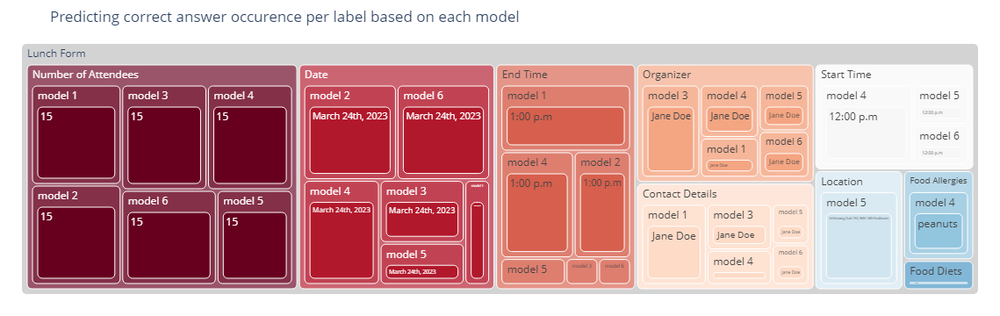

In [60]:
fig = px.treemap(df_correct_prediction, path=[px.Constant("Lunch Form"), 'label', 'model', 'actual_answer'], color_discrete_sequence=px.colors.sequential.RdBu,values='occurence', title="Predicting correct answer occurence per label based on each model")
fig.update_traces(root_color="lightgrey", marker=dict(cornerradius=5))
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

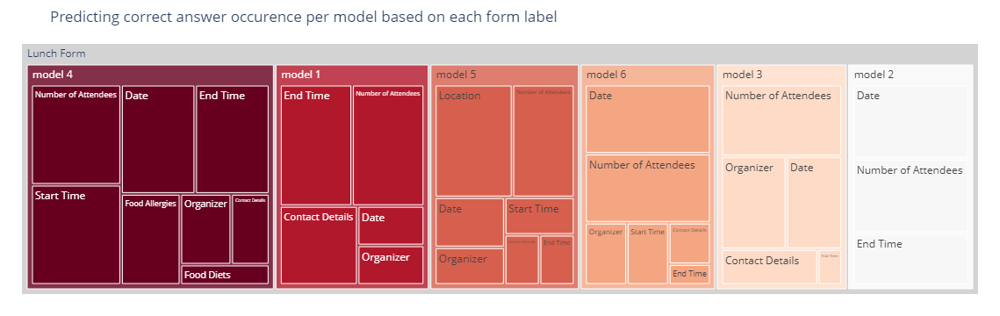

In [61]:
fig = px.treemap(df_correct_prediction, path=[px.Constant("Lunch Form"), 'model', 'label'], values='occurence',color_discrete_sequence=px.colors.sequential.RdBu, title="Predicting correct answer occurence per model based on each form label")
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

### 4.1.2. Visualizing total Confidence Score
I will be visualizing the total confidence score for each model of predicting the correct answer for each label to see which model performs the best overal.

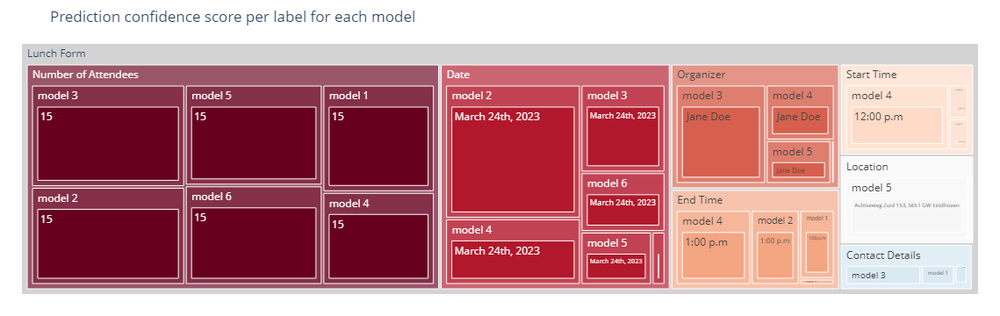

In [62]:
fig = px.treemap(df_correct_prediction, path=[px.Constant("Lunch Form"), 'label', 'model', 'actual_answer'], color_discrete_sequence=px.colors.sequential.RdBu,values='score', title="Prediction confidence score per label for each model")
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

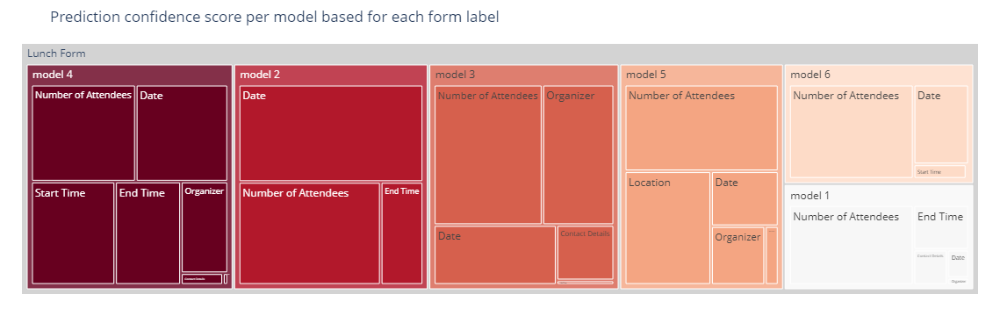

In [63]:
import plotly.express as px
fig = px.treemap(df_correct_prediction, path=[px.Constant("Lunch Form"), 'model', 'label'], values='score', color_discrete_sequence=px.colors.sequential.RdBu,title="Prediction confidence score per model based for each form label")
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

## 4.2. PieCharts

### 4.2.1 Basic Pie Chart

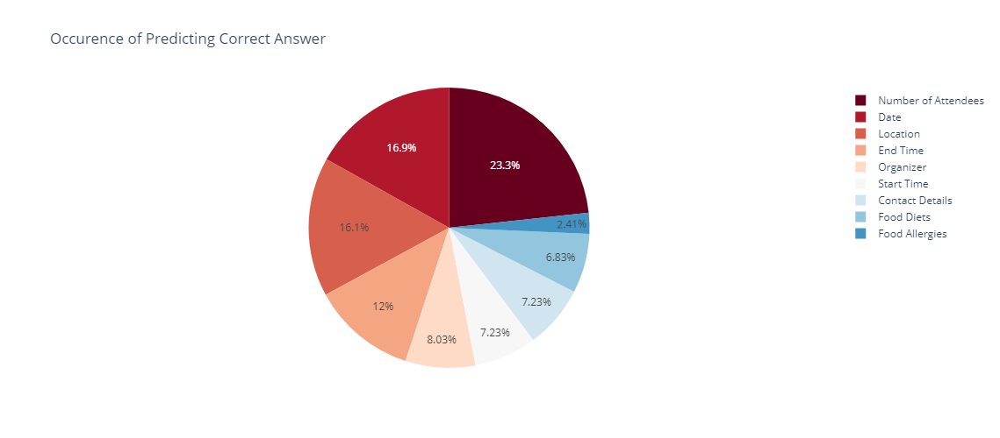

In [101]:
fig = px.pie(df_correct_prediction, values='occurence', names='label',width=1000, height=500, color_discrete_sequence=px.colors.sequential.RdBu, title='Occurence of Predicting Correct Answer')
fig.show()
# fig = px.pie(df_correct_prediction, values='occurence', names='label',width=1000, height=500, title='Occurence of Predicting Correct Answer')
# fig.show()

### 4.2.2. Pie chart in Dash

In [70]:
app = Dash(__name__)


app.layout = html.Div([
    html.H4('Analysis of the question answering models performances'),
    dcc.Graph(id="graph"),
    html.P("Names:"),
    dcc.Dropdown(id='names',
        options=['label', 'model', 'questions'],
        value='model', clearable=False
    ),
    html.P("Values:"),
    dcc.Dropdown(id='values',
        options=['score', 'percentage', 'occurence'],
        value='score', clearable=False
    ),
])

In [71]:
@app.callback(
    Output("graph", "figure"), 
    Input("names", "value"), 
    Input("values", "value"))
def generate_chart(names, values):
    # df = px.data.tips() # replace with your own data source
    fig = px.pie(df, values=values, names=names, hole=.3)
    return fig

if __name__ == '__main__':
    app.run_server()
    # app.run_server(debug=True)

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app 'Data-Visualization-Exercise' (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:8050/ (Press CTRL+C to quit)
127.0.0.1 - - [04/Apr/2023 14:12:21] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:21] "GET /_dash-layout HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:21] "GET /_dash-dependencies HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:21] "GET /_dash-component-suites/dash/dcc/async-graph.js HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:21] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:21] "GET /_dash-component-suites/dash/dcc/async-dropdown.js HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:21] "GET /_dash-component-suites/dash/dcc/async-plotlyjs.js HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:24] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:30] "POST /_dash-update-component HTTP/1.1" 200 -
127.0.0.1 - - [04/Apr/2023 14:12:34] "POST /_dash-update-component HTTP/1.1" 200 -


## 4.3. Dot Plot
Dot plots (also known as Cleveland dot plots) are scatter plots with one categorical axis and one continuous axis. They can be used to show changes between two (or more) points in time or between two (or more) conditions. Compared to a bar chart, dot plots can be less cluttered and allow for an easier comparison between conditions.

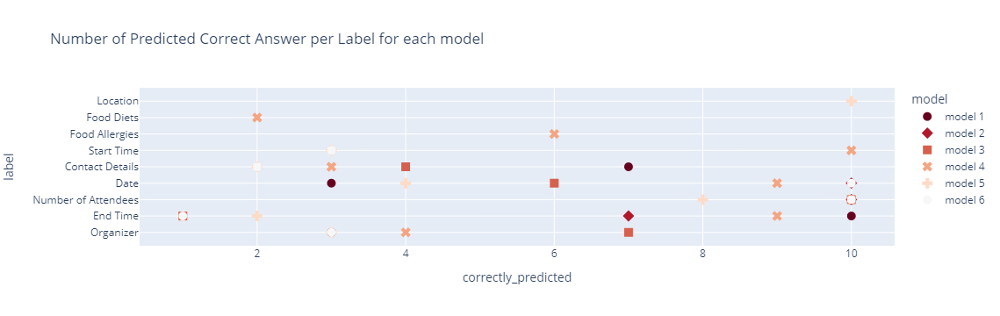

In [66]:
fig = px.scatter(score_by_label.sort_values('model'), y="label", x="correctly_predicted", color="model", symbol="model", color_discrete_sequence=px.colors.sequential.RdBu,
             title='Number of Predicted Correct Answer per Label for each model')
fig.update_traces(marker_size=10)
fig.show()

## 4.4. Horizontal Bar Charts in Python


### 4.4.1. Visualizing Number of Occurence
I will be visualizing the number of occurences each model predicts the correct answer for each label to see which model performs the best overal with using the horizontal bar chart.

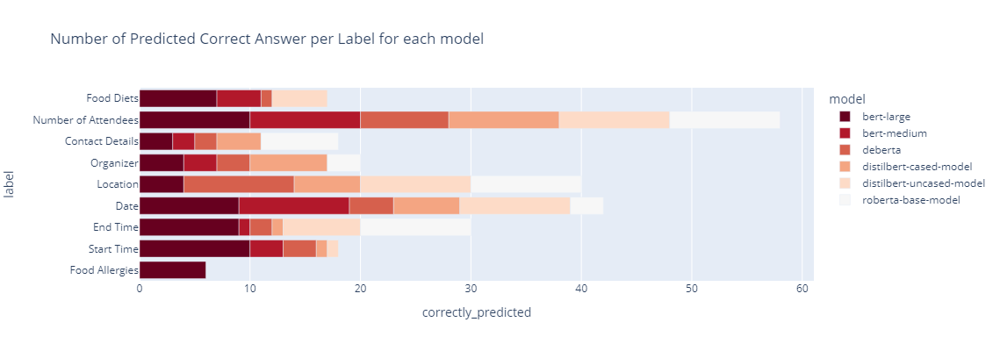

In [12]:
fig = px.bar(score_by_label.sort_values('model'), x="correctly_predicted", y="label", color='model', orientation='h',color_discrete_sequence=px.colors.sequential.RdBu,
             hover_data=["correctly_predicted", "score"],
             height=400,
             title='Number of Predicted Correct Answer per Label for each model')
fig.show()

### 4.4.2. Visualizing total Confidence Score
I will be visualizing the total confidence score for each model of predicting the correct answer for each label to see which model performs the best overal with using the horizontal bar chart.


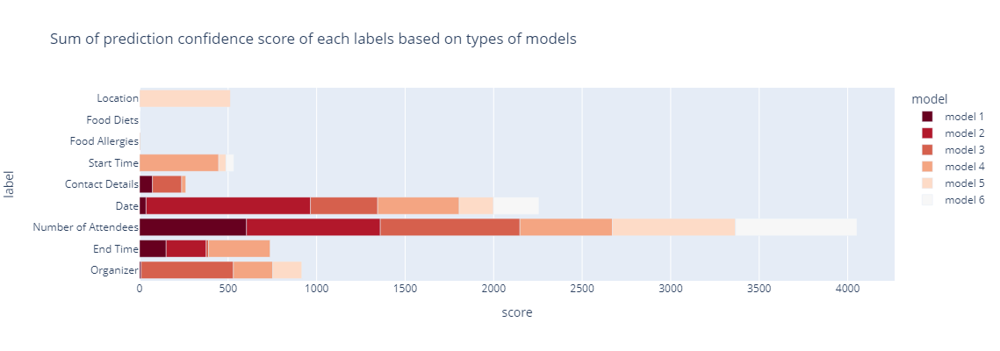

In [68]:
fig = px.bar(score_by_label.sort_values('model'), x="score", y="label", color='model', orientation='h',color_discrete_sequence=px.colors.sequential.RdBu,
             hover_data=["correctly_predicted", "score"],
             height=400,
             title='Sum of prediction confidence score of each labels based on types of models')
fig.show()

## 4.5. Sunburst Charts
Sunburst plots visualize hierarchical data spanning outwards radially from root to leaves. Similar to Icicle charts and Treemaps, the hierarchy is defined by labels (names for px.icicle) and parents attributes. The root starts from the center and children are added to the outer rings.



### 4.5.1. Visualizing Number of Occurence
I will be visualizing the number of occurences each model predicts the correct answer for each label to see which model performs the best overal.

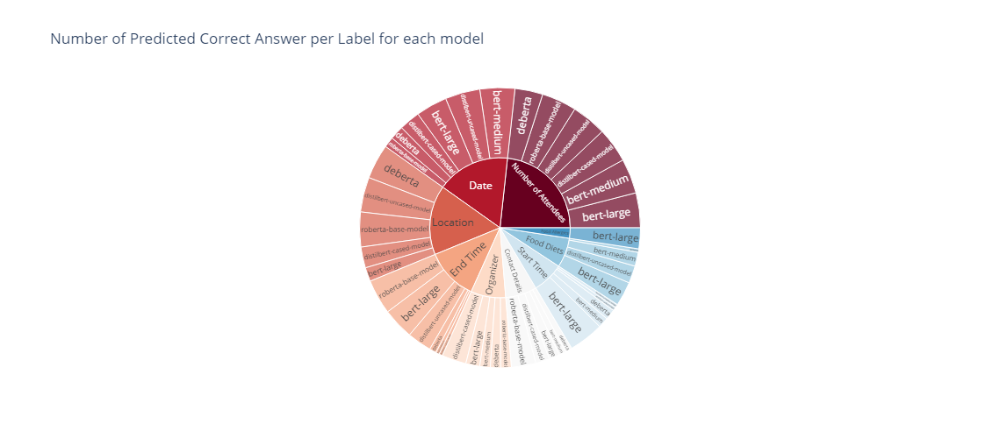

In [279]:
fig = px.sunburst(score_by_label, path=['label', 'model'],width=1000, height=500, values='correctly_predicted',color_discrete_sequence=px.colors.sequential.RdBu,
             title='Number of Predicted Correct Answer per Label for each model')
fig.show()

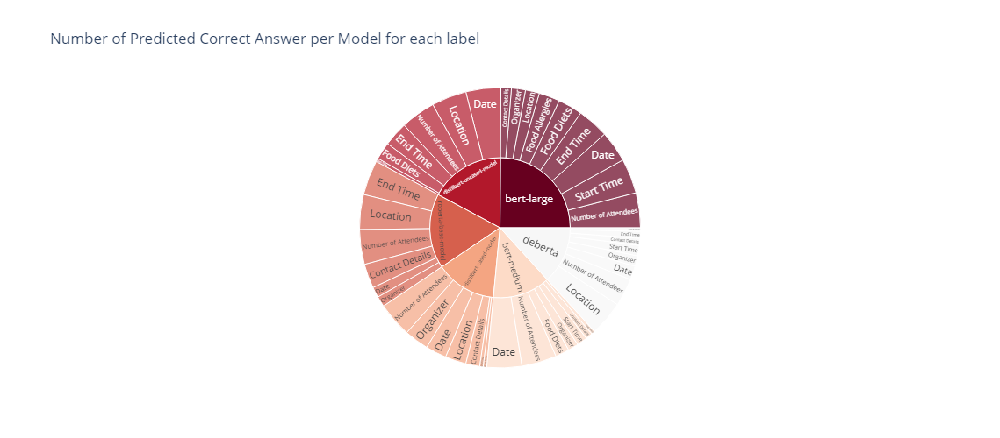

In [287]:
fig = px.sunburst(score_by_label, path=['model', 'label'], width=1000, height=500, values='correctly_predicted',color_discrete_sequence=px.colors.sequential.RdBu,
             title='Number of Predicted Correct Answer per Model for each label')
fig.show()

### 4.5.2. Visualizing total Confidence Score
I will be visualizing the total confidence score for each model of predicting the correct answer for each label to see which model performs the best overal.

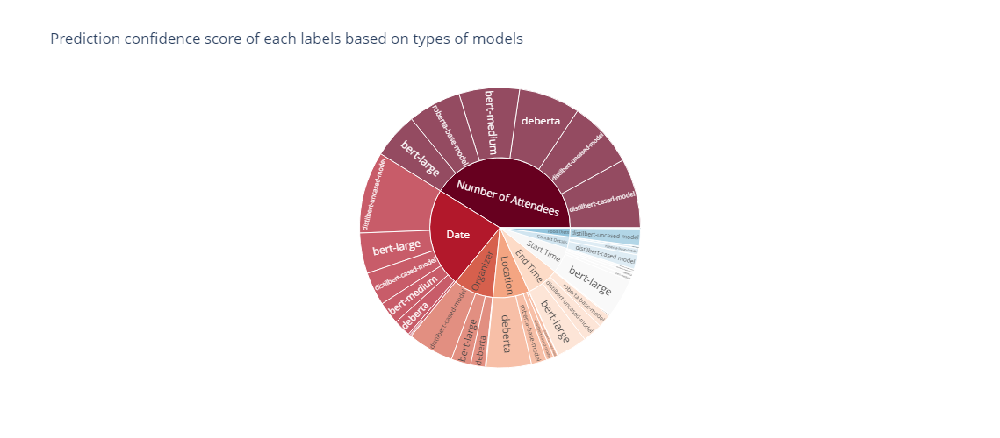

In [284]:
fig = px.sunburst(score_by_label, path=['label', 'model'], values='score',width=1000, height=500, color_discrete_sequence=px.colors.sequential.RdBu,title = 'Prediction confidence score of each labels based on types of models')
fig.show()

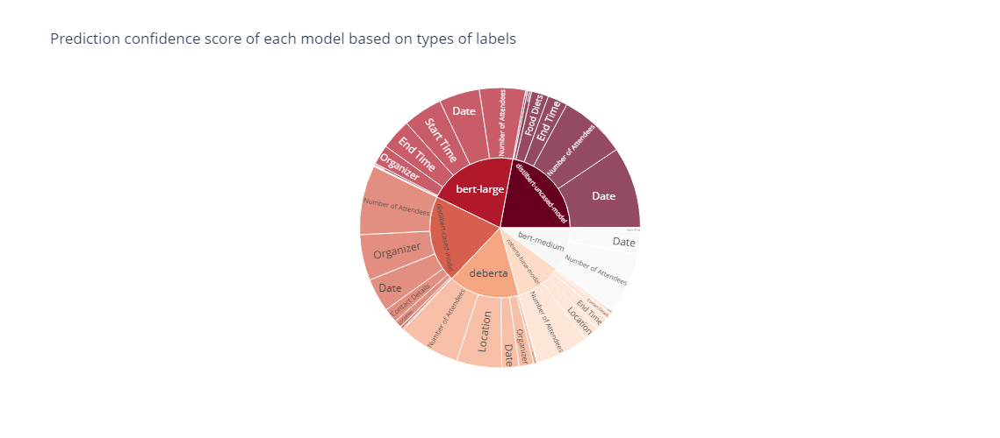

In [288]:
fig = px.sunburst(score_by_label, path=['model', 'label'], values='score',width=1000, height=500, color_discrete_sequence=px.colors.sequential.RdBu,title = 'Prediction confidence score of each model based on types of labels')
fig.show()

## 4.6. Icicle Charts
Icicle charts visualize hierarchical data using rectangular sectors that cascade from root to leaves in one of four directions: up, down, left, or right. Similar to Sunburst charts and Treemaps charts, the hierarchy is defined by labels (names for px.icicle) and parents attributes. Click on one sector to zoom in/out, which also displays a pathbar on the top of your icicle. To zoom out, you can click the parent sector or click the pathbar as well.



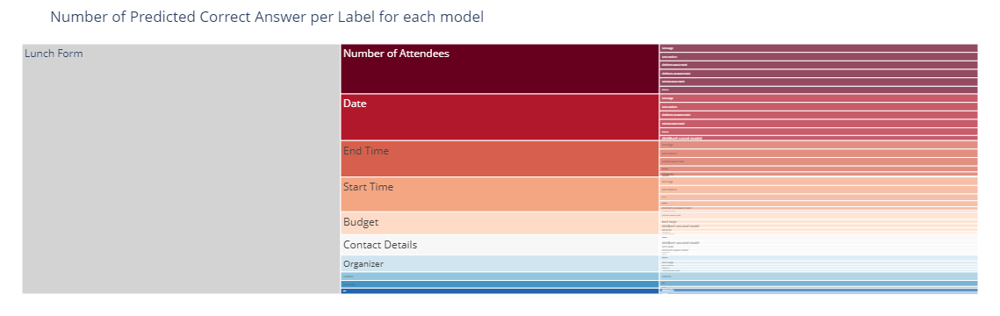

In [68]:
fig = px.icicle(score_by_label, path=[px.Constant("Lunch Form"), 'label', 'model'], values='correctly_predicted',color_discrete_sequence=px.colors.sequential.RdBu,
             title='Number of Predicted Correct Answer per Label for each model')
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

## 4.7. Patterned Charts

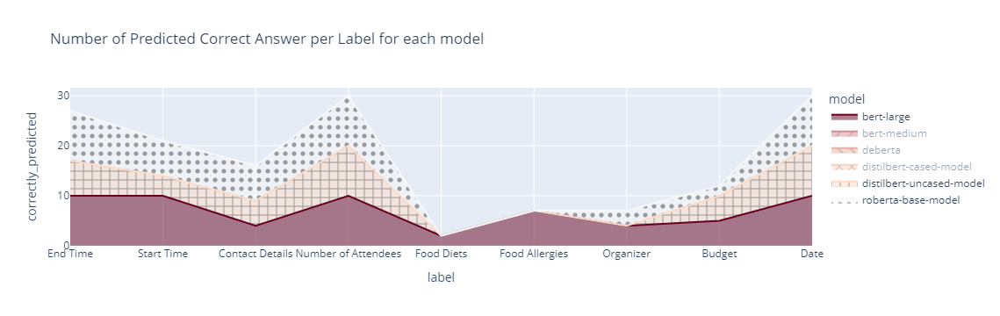

In [69]:
fig = px.area(score_by_label.sort_values('model'), x="label", y="correctly_predicted", color="model", pattern_shape="model",color_discrete_sequence=px.colors.sequential.RdBu,
             title='Number of Predicted Correct Answer per Label for each model')
fig.show()

fig.write_html(r"C:\Users\victo\source\repos\Semester 7\JupyterLab\Data Visualization\file.html")

## 4.8. Parallel Coordinates Chart
I will be using the correct predicted answers and plotting the dataframe in a parallel chart to see which model performs the best

In [ ]:
df_correct_prediction.head()

,label,questions,answer,score,model,percentage,actual_answer,occurence,correctly_predicted,interrogative_pronouns,model_num
0,Number of Attendees,what Number of Attendees?,15,62.77,roberta-base-model,10.392900,15,1,True,what,1.0
1,Number of Attendees,who Number of Attendees?,15,67.06,roberta-base-model,11.103200,15,1,True,who,1.0
2,Number of Attendees,where Number of Attendees?,15,46.99,roberta-base-model,7.780188,15,1,True,where,1.0
3,Number of Attendees,when Number of Attendees?,15,55.51,roberta-base-model,9.190854,15,1,True,when,1.0
4,Number of Attendees,why Number of Attendees?,15,55.14,roberta-base-model,9.129593,15,1,True,why,1.0


In [ ]:
table = pd.pivot_table(df_correct_prediction, values='occurence', index=['interrogative_pronouns', 'model'],
                       columns=['label'], aggfunc=np.sum, fill_value=0)


In [ ]:
table = table.reset_index(level=[0,1])
table.head(7)

label,interrogative_pronouns,model,Contact Details,Date,End Time,Food Allergies,Food Diets,Location,Number of Attendees,Organizer,Start Time
0,how,bert-large,0,1,0,1,1,1,1,0,1
1,how,bert-medium,0,1,0,0,0,0,1,0,0
2,how,deberta,0,0,0,0,0,1,1,1,1
3,how,distilbert-cased-model,0,1,0,0,0,1,1,1,0
4,how,distilbert-uncased-model,0,1,1,0,0,1,1,0,0
5,how,roberta-base-model,1,0,1,0,0,1,1,0,0
6,how many,bert-large,0,1,1,0,0,1,1,0,1


In [ ]:
table['model_num'] = None

table.loc[table['model'] == 'roberta-base-model', 'model_num'] = 1
table.loc[table['model'] == 'distilbert-uncased-model', 'model_num'] = 2
table.loc[table['model'] == 'distilbert-cased-model', 'model_num'] = 3
table.loc[table['model'] == 'bert-large', 'model_num'] = 4
table.loc[table['model'] == 'deberta', 'model_num'] = 5
table.loc[table['model'] == 'bert-medium', 'model_num'] = 6
table.head()

label,interrogative_pronouns,model,Contact Details,Date,End Time,Food Allergies,Food Diets,Location,Number of Attendees,Organizer,Start Time,model_num
0,how,bert-large,0,1,0,1,1,1,1,0,1,4
1,how,bert-medium,0,1,0,0,0,0,1,0,0,6
2,how,deberta,0,0,0,0,0,1,1,1,1,5
3,how,distilbert-cased-model,0,1,0,0,0,1,1,1,0,3
4,how,distilbert-uncased-model,0,1,1,0,0,1,1,0,0,2


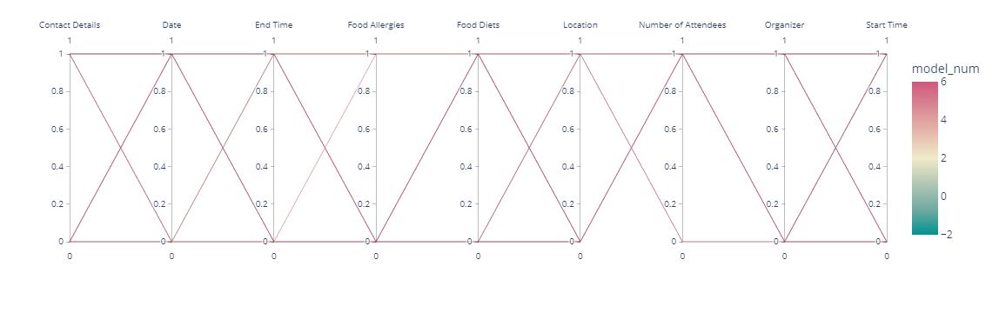

In [ ]:
fig = px.parallel_coordinates(table, color='model_num',
                              dimensions=['Contact Details', 'Date', 'End Time', 'Food Allergies', 'Food Diets', 'Location', 'Number of Attendees', 'Organizer', 'Start Time'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

In [275]:
table = pd.pivot_table(df_correct_prediction, values='score', index=['interrogative_pronouns', 'model'],
                       columns=['label'], aggfunc=np.sum, fill_value=0)


In [276]:
table = table.reset_index(level=[0,1])
table.head(7)

label,interrogative_pronouns,model,Contact Details,Date,End Time,Food Allergies,Food Diets,Location,Number of Attendees,Organizer,Start Time
0,how,bert-large,0.00,47.61,0.00,0.01,1.14,1.05,55.15,0.00,43.50
1,how,bert-medium,0.00,24.63,0.00,0.00,0.00,0.00,77.73,0.00,0.00
2,how,deberta,0.00,0.00,0.00,0.00,0.00,99.47,86.00,0.04,0.00
3,how,distilbert-cased-model,0.00,71.77,0.00,0.00,0.00,1.05,84.97,67.32,0.00
4,how,distilbert-uncased-model,0.00,91.93,32.85,0.00,0.00,3.02,76.71,0.00,0.00
5,how,roberta-base-model,6.99,0.00,7.01,0.00,0.00,19.64,64.16,0.00,0.00
6,how many,bert-large,0.00,32.34,34.68,0.00,0.00,0.06,60.52,0.00,53.02


In [277]:
table['model_num'] = None

table.loc[table['model'] == 'roberta-base-model', 'model_num'] = 1
table.loc[table['model'] == 'distilbert-uncased-model', 'model_num'] = 2
table.loc[table['model'] == 'distilbert-cased-model', 'model_num'] = 3
table.loc[table['model'] == 'bert-large', 'model_num'] = 4
table.loc[table['model'] == 'deberta', 'model_num'] = 5
table.loc[table['model'] == 'bert-medium', 'model_num'] = 6
table.head()

label,interrogative_pronouns,model,Contact Details,Date,End Time,Food Allergies,Food Diets,Location,Number of Attendees,Organizer,Start Time,model_num
0,how,bert-large,0.0,47.61,0.00,0.01,1.14,1.05,55.15,0.00,43.5,4
1,how,bert-medium,0.0,24.63,0.00,0.00,0.00,0.00,77.73,0.00,0.0,6
2,how,deberta,0.0,0.00,0.00,0.00,0.00,99.47,86.00,0.04,0.0,5
3,how,distilbert-cased-model,0.0,71.77,0.00,0.00,0.00,1.05,84.97,67.32,0.0,3
4,how,distilbert-uncased-model,0.0,91.93,32.85,0.00,0.00,3.02,76.71,0.00,0.0,2


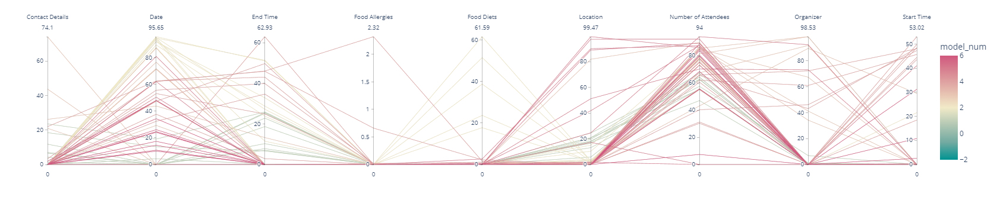

In [278]:
fig = px.parallel_coordinates(table, color='model_num',
                              dimensions=['Contact Details', 'Date', 'End Time', 'Food Allergies', 'Food Diets', 'Location', 'Number of Attendees', 'Organizer', 'Start Time'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

# Conclusion
To conclude, this notebook shows different visualization plots that express the data collected with both using the Bokeh and Plotly tools. During this exercise I not only learned how to use these two tools but also different ways to visualize my data in a more user friendly way of interacting with the data which I personally like.

In [289]:
plotly.offline.init_notebook_mode()